<a href="https://colab.research.google.com/github/dickyaryag6/-dickyaryag6-.github.io/blob/master/Prediksi%20Tingkat%20Kemiskinan%20Rumah%20Tangga%20menggunakan%20Metode%20Support%20Vector%20Machine.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
#library
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
%matplotlib inline
import seaborn as sns
import copy 
from sklearn import preprocessing
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.decomposition import PCA 
from sklearn import datasets 
from sklearn.metrics import confusion_matrix ,classification_report
from sklearn.svm import SVC 
from statistics import median
# from skmca import MCA
import prince
from sklearn.model_selection import cross_val_score, GridSearchCV

In [0]:
!pip install prince

In [0]:
from google.colab import files
uploaded = files.upload()

Saving test.csv to test.csv
Saving train.csv to train.csv
Saving trainnonohead.csv to trainnonohead.csv


In [0]:
# train=pd.read_csv('train.csv')
test=pd.read_csv('test.csv')
train=pd.read_csv('trainnonohead.csv')

In [0]:
trainasli=pd.read_csv('train.csv')

# **`Pre-Process`**

In [0]:
train.select_dtypes('object').head(n=20)
#columns dependency, edjefe, dan edjefa memiliki tipe data yang campur
# According to the documentation for these columns:

# dependency: Dependency rate, calculated = (number of members of the household younger than 19 or older than 64)/(number of member of household between 19 and 64)
# edjefe: years of education of male head of household, based on the interaction of escolari (years of education), head of household and gender, yes=1 and no=0
# edjefa: years of education of female head of household, based on the interaction of escolari (years of education), head of household and gender, yes=1 and no=0
# berarti yang nilainya yes diganti jadi 1, yang nilainya no diganti jadi 0

,Id,idhogar,dependency,edjefe,edjefa
0,ID_279628684,21eb7fcc1,no,10,no
1,ID_f29eb3ddd,0e5d7a658,8,12,no
2,ID_68de51c94,2c7317ea8,8,no,11
3,ID_d671db89c,2b58d945f,yes,11,no
4,ID_d56d6f5f5,2b58d945f,yes,11,no
5,ID_ec05b1a7b,2b58d945f,yes,11,no
6,ID_e9e0c1100,2b58d945f,yes,11,no
7,ID_3e04e571e,d6dae86b7,yes,9,no
8,ID_1284f8aad,d6dae86b7,yes,9,no
9,ID_51f52fdd2,d6dae86b7,yes,9,no


In [0]:
#kolom dengan tipe 'object'


#ngeganti yes jadi 1 dan no jadi 0
mapping = {"yes": 1, "no": 0}

# # Apply same operation to both train and test
for df in [train, test]:
    # Fill in the values with the correct mapping
    df['dependency'] = df['dependency'].replace(mapping).astype(np.float64)
    df['edjefa'] = df['edjefa'].replace(mapping).astype(np.float64)
    df['edjefe'] = df['edjefe'].replace(mapping).astype(np.float64)

train[['dependency','edjefa', 'edjefe']].describe()
# train.select_dtypes('object').head(n=10)

,dependency,edjefa,edjefe
count,9534.000000,9534.000000,9534.000000
mean,1.149544,2.900986,5.095553
std,1.607683,4.615461,5.248847
min,0.000000,0.000000,0.000000
25%,0.333333,0.000000,0.000000
50%,0.666667,0.000000,6.000000
75%,1.333333,6.000000,9.000000
max,8.000000,21.000000,21.000000


In [0]:
train.shape

(9534, 143)

1     755
2    1597
3    1189
4    5993
Name: Target, dtype: int64

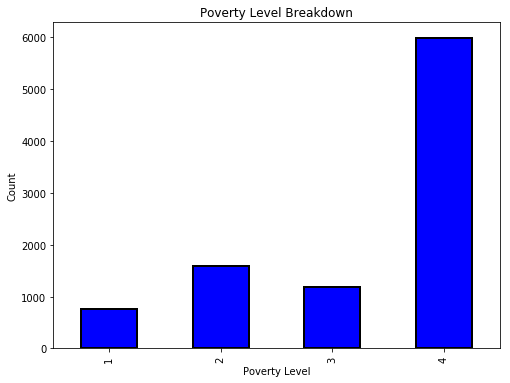

In [0]:
#melihat distribusi label
#karena nilai kelas diwakili oleh kepala keluarga, yang diliat nilai dari kepala keluarganya aja
# # Heads of household
# heads = train.loc[train['parentesco1'] == 1].copy()


# # Labels for training
# train_labels = train.loc[(train['Target'].notnull()) & (train['parentesco1'] == 1), ['Target', 'idhogar']]

# Value counts of target
# label_counts = train_labels['Target'].value_counts().sort_index()
label_counts = train['Target'].value_counts().sort_index()

# Bar plot of occurrences of each label
label_counts.plot.bar(figsize = (8, 6),
                      color = 'blue',
                      edgecolor = 'k', linewidth = 2)

# Formatting
plt.xlabel('Poverty Level');
plt.ylabel('Count');
# plt.xticks([x - 1 for x in poverty_mapping.keys()], 
#            list(poverty_mapping.values()), rotation = 60)
plt.title('Poverty Level Breakdown');

label_counts

In [0]:
# from collections import Counter
# from sklearn.datasets import make_classification
# from imblearn.under_sampling import RandomUnderSampler # doctest: +NORMALIZE_WHITESPACE

# print('Original dataset shape %s' % Counter(y))

# rus = RandomUnderSampler(random_state=42)
# X_res, y_res = rus.fit_resample(X, y)
# >>> print('Resampled dataset shape %s' % Counter(y_res))


In [0]:
#wrong labels
#data yang anggota keluarganya tidak memiliki kelas yang sama dengan kepala keluarganya
# Groupby the household and figure out the number of unique values
all_equal = train.groupby('idhogar')['Target'].apply(lambda x: x.nunique() == 1)

# Households where targets are not all equal
not_equal = all_equal[all_equal != True]
print('Jumlah household yang anggota keluarganya mempunyai label berbeda-beda adalah {}.'.format(len(not_equal)))

#buat semua anggota kelaurga mempunyai nilai yang sama dengan kelas dari kepala keluarga
# Iterate through each household
for household in not_equal.index:
    # Find the correct label (for the head of household)
    true_target = int(train[(train['idhogar'] == household) & (train['parentesco1'] == 1.0)]['Target'])
    
    # Set the correct label for all members in the household
    train.loc[train['idhogar'] == household, 'Target'] = true_target
    

Jumlah household yang anggota keluarganya mempunyai label berbeda-beda adalah 85.


In [0]:
print(not_equal)

idhogar
0172ab1d9    False
03f4e5f4d    False
0511912b6    False
078a0b6e2    False
09e25d616    False
0f3e65c83    False
0f9494d3a    False
15a891635    False
17fb04a62    False
18832b840    False
26b3a0f41    False
288579c97    False
28893b5e7    False
2c9872b82    False
2cb443214    False
309fb7246    False
30a70901d    False
3c6973219    False
3c73c107f    False
3df651058    False
3fe29a56b    False
410194c8b    False
417865404    False
42ec8bef5    False
43b9c83e5    False
44f219a16    False
46af47063    False
4b6077882    False
4c2dba109    False
4dc11e11f    False
             ...  
80a66379b    False
811a35744    False
8242a51ec    False
8420bcfca    False
8ae3e74ca    False
8bb6da3c1    False
932287f5d    False
9bbf7c6ca    False
a20ff33ba    False
a3288e6fa    False
a94a45642    False
bcaa2e2f5    False
bcab69521    False
bd82509d1    False
be91da044    False
c13325faf    False
c38913488    False
c7ce4e30c    False
cc971b690    False
d64524b6b    False
d9b1558b5    False
daaf

In [0]:
#ada data yang gak mempunyai kepala keluarga
households_leader = trainasli.groupby('idhogar')['parentesco1'].sum()


# Find households without a head
households_no_head = trainasli.loc[trainasli['idhogar'].isin(households_leader[households_leader == 0].index), :]


# #jumlah totalnya ada 23 orang sehingga dihapus aja
print('Jumlah household tanpa kepala keluarga adalah {}.'.format(households_no_head['idhogar'].nunique()))
# print(households_no_head['Id'])
# data=data.drop(households_no_head['idhogar'], inplace = True, index_col='idhogar')
# print('Jumlah household tanpa kepala keluarga adalah {}.'.format(households_no_head['idhogar']))


# for i in len(households_no_head_id):
#   data.drop(data.index[i])
# #anggota keluarga yang tidak mempunyai kepala keluarga, tapi punya kelas yang beda beda
# households_no_head_equal = households_no_head.groupby('idhogar')['Target'].apply(lambda x: x.nunique() == 1)
# print('{} Households with no head have different labels.'.format(sum(households_no_head_equal == False)))

Jumlah household tanpa kepala keluarga adalah 15.


**`Filling Missing Value`**





In [0]:
# Number of missing in each column
missing1 = pd.DataFrame(train.isnull().sum()).rename(columns = {0: 'total'})
# missing2= pd.DataFrame(test.isnull().sum()).rename(columns = {0: 'total'})
# missing=missing1+missing2

# Create a percentage missing
# missing['percent'] = missing['total'] / (len(train)+len(test))
missing1['percent'] = missing1['total'] / len(train)

missing1.sort_values('percent', ascending = False).head(10)

,total,percent
rez_esc,7921,0.830816
v18q1,7319,0.767674
v2a1,6843,0.717747
SQBmeaned,5,0.000524
meaneduc,5,0.000524
Id,0,0.000000
hogar_adul,0,0.000000
parentesco10,0,0.000000
parentesco11,0,0.000000
parentesco12,0,0.000000


In [0]:
missing1.sort_values('percent', ascending = False).head(10)

,total,percent
Id,0,0.0
hogar_mayor,0,0.0
parentesco10,0,0.0
parentesco11,0,0.0
parentesco12,0,0.0
idhogar,0,0.0
hogar_nin,0,0.0
hogar_adul,0,0.0
hogar_total,0,0.0
parentesco8,0,0.0


In [0]:
#kolom v18q1
# groupby the value of v18q (which is 1 for owns a tablet and 0 for does not) 
# and then calculate the number of null values for v18q1. 
# This will tell us if the null values represent that the family does not own a tablet.
train.groupby('v18q')['v18q1'].apply(lambda x: x.isnull().sum())
#semua keluarga yang memiliki nilai null pada kolom v18q1 tidak mempunyai tablet
#keterangan punya tablet atau tidak terletak pada kolom v18q
 
train['v18q1'] = train['v18q1'].fillna(0)
test['v18q1'] = test['v18q1'].fillna(0)
#isi kolom v18q1 yng bernilai null dengan angka 0
#jadi kolom v18q dihilangkan saja

In [0]:
#menghilangkan kolom v18q
train=train.drop(['v18q'], axis=1)
test=test.drop(['v18q'], axis=1)

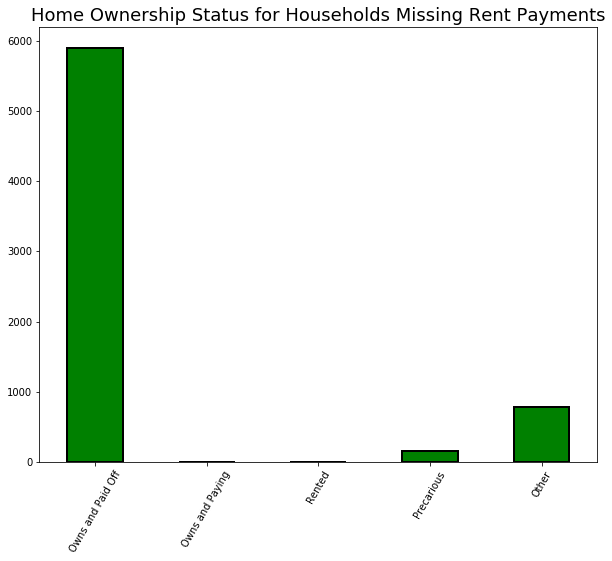

In [0]:
#kolom v2a1 : rent payment
# Variables indicating home ownership
own_variables = [x for x in train if x.startswith('tipo')]

# Plot of the home ownership variables for home missing rent payments
train.loc[train['v2a1'].isnull(), own_variables].sum().plot.bar(figsize = (10, 8),
                                                              color = 'green',
                                                              edgecolor = 'k', linewidth = 2);
plt.xticks([0, 1, 2, 3, 4],
           ['Owns and Paid Off', 'Owns and Paying', 'Rented', 'Precarious', 'Other'],
          rotation = 60)
plt.title('Home Ownership Status for Households Missing Rent Payments', size = 18);


#semua data yang kolom owns and paid off memiliki nilai kolom v2a1 yaitu 0

In [0]:
# Fill in households that own the house with 0 rent payment
# yg ownership owns and paid offn di assign nilai v2a1 sama dengan 0
for data in [train, test]:
  data.loc[(data['tipovivi1'] == 1), 'v2a1'] = 0
  data.loc[(data['tipovivi5'] == 1), 'v2a1'] = 0
  data.loc[(data['tipovivi4'] == 1), 'v2a1'] = 0


# yang other itu dari keterangan dataset berarti disuruh menempati rumah itu atau dipinjamkan, jadi dianggap bayar sewa 0

# Create missing rent payment column
# For the houses that are owned and have a missing monthly rent payment, 
# we can set the value of the rent payment to zero. For the other homes, 
# we can leave the missing values to be imputed but we'll add a flag (Boolean) column indicating that these households had missing values.

In [0]:
#kolom rez_esc: years behind in school
# this variable is only defined for individuals between 7 and 19. 
# Anyone younger or older than this range presumably has no years behind and therefore the value should be set to 0. 
# For this variable, if the individual is over 19 and they have a missing value, or if they are younger than 7 and have a missing value we can set it to zero. 
# For anyone else, we'll leave the value to be imputed and add a boolean flag.

# data.loc[data['rez_esc'].notnull()]['age'].describe()
# data.loc[data['rez_esc'].isnull()]=0

#   yang kurang dari 6 dan lebih dari 18 diberi nilai 0
train.loc[((train['age'] > 18) | (train['age'] < 6)) & (train['rez_esc'].isnull()), 'rez_esc'] = 0
test.loc[((test['age'] > 18) | (test['age'] < 6)) & (test['rez_esc'].isnull()), 'rez_esc'] = 0
#   yang usia sekolah tapi missing diberi nilai median atribut
train.rez_esc.fillna(train.rez_esc.median(),inplace=True)
test.rez_esc.fillna(test.rez_esc.median(),inplace=True)

In [0]:
#kolom meaneduc
#row nya dihilangkan saja karena cuma dikit
# train.drop(data[data['meaneduc'] == ].index)
trainmean=train[train['meaneduc'].isnull()]
testmean=test[test['meaneduc'].isnull()]

trainmean1=trainmean['Id']
testmean1=testmean['Id']
# datamean
# datamean = data.groupby('idhogar')['parentesco1'].sum()
# datamean1=data.loc[data['Id'].isin(datamean1.index), :]
# datamean1
# datamean1=data[data['meaneduc'].isnull()]
train=train.drop(train[train.Id.isin(trainmean1)].index.tolist())
test=test.drop(test[test.Id.isin(testmean1)].index.tolist())
# data2=data.drop(data[data['Id'] == datamean1].index)


There are several different categories of variables:



1. Individual Variables: these are characteristics of each individual rather than the household

  * Boolean: Yes or No (0 or 1)
  * Ordered Discrete: Integers with an ordering

2.  Household variables
  * Boolean: Yes or No
  * Ordered Discrete: Integers with an ordering
   * Continuous numeric
   
3.  Squared Variables: derived from squaring variables in the data
4.  Id variables: identifies the data and should not be used as features









In [0]:
id_ = ['Id', 'idhogar', 'Target']
ind_bool = ['dis', 'male', 'female', 'estadocivil1', 'estadocivil2', 'estadocivil3', 
            'estadocivil4', 'estadocivil5', 'estadocivil6', 'estadocivil7', 
            'parentesco1', 'parentesco2',  'parentesco3', 'parentesco4', 'parentesco5', 
            'parentesco6', 'parentesco7', 'parentesco8',  'parentesco9', 'parentesco10', 
            'parentesco11', 'parentesco12', 'instlevel1', 'instlevel2', 'instlevel3', 
            'instlevel4', 'instlevel5', 'instlevel6', 'instlevel7', 'instlevel8', 
            'instlevel9', 'mobilephone']

ind_bool1 = ['dis', 'female', 'estadocivil1', 'estadocivil2', 'estadocivil3', 
            'estadocivil4', 'estadocivil5', 'estadocivil6', 'estadocivil7', 
            'parentesco1', 'parentesco2',  'parentesco3', 'parentesco4', 'parentesco5', 
            'parentesco6', 'parentesco7', 'parentesco8',  'parentesco9', 'parentesco10', 
            'parentesco11', 'parentesco12', 'instlevel1', 'instlevel2', 'instlevel3', 
            'instlevel4', 'instlevel5', 'instlevel6', 'instlevel7', 'instlevel8', 
            'instlevel9', 'mobilephone']

# 'area2', 'abastaguafuera', 'energcocinar3', 'sanitario3', 'coopele', 'male']



ind_ordered = ['rez_esc', 'escolari', 'age']
hh_bool = ['hacdor', 'hacapo', 'v14a', 'refrig', 'paredblolad', 'paredzocalo', 
           'paredpreb','pisocemento', 'pareddes', 'paredmad',
           'paredzinc', 'paredfibras', 'paredother', 'pisomoscer', 'pisoother', 
           'pisonatur', 'pisonotiene', 'pisomadera',
           'techozinc', 'techoentrepiso', 'techocane', 'techootro', 'cielorazo', 
           'abastaguadentro', 'abastaguafuera', 'abastaguano',
            'public', 'planpri', 'noelec', 'coopele', 'sanitario1', 
           'sanitario2', 'sanitario3', 'sanitario5',   'sanitario6',
           'energcocinar1', 'energcocinar2', 'energcocinar3', 'energcocinar4', 
           'elimbasu1', 'elimbasu2', 'elimbasu3', 'elimbasu4', 
           'elimbasu5', 'elimbasu6', 'epared1', 'epared2', 'epared3',
           'etecho1', 'etecho2', 'etecho3', 'eviv1', 'eviv2', 'eviv3', 
           'tipovivi1', 'tipovivi2', 'tipovivi3', 'tipovivi4', 'tipovivi5', 
           'computer', 'television', 'lugar1', 'lugar2', 'lugar3',
           'lugar4', 'lugar5', 'lugar6', 'area1', 'area2']
hh_bool1 = ['hacdor', 'hacapo', 'v14a', 'refrig', 'paredblolad', 'paredzocalo', 
           'paredpreb','pisocemento', 'pareddes', 'paredmad',
           'paredzinc', 'paredfibras', 'paredother', 'pisomoscer', 'pisoother', 
           'pisonatur', 'pisonotiene', 'pisomadera',
           'techozinc', 'techoentrepiso', 'techocane', 'techootro', 'cielorazo', 
           'abastaguadentro', 'abastaguano',
            'public', 'planpri', 'noelec', 'sanitario1', 
           'sanitario2', 'sanitario5',   'sanitario6',
           'energcocinar1', 'energcocinar2', 'energcocinar4', 
           'elimbasu1', 'elimbasu2', 'elimbasu3', 'elimbasu4', 
           'elimbasu5', 'elimbasu6', 'epared1', 'epared2', 'epared3',
           'etecho1', 'etecho2', 'etecho3', 'eviv1', 'eviv2', 'eviv3', 
           'tipovivi1', 'tipovivi2', 'tipovivi3', 'tipovivi4', 'tipovivi5', 
           'computer', 'television', 'lugar1', 'lugar2', 'lugar3',
           'lugar4', 'lugar5', 'lugar6', 'area1']

hh_ordered = [ 'rooms', 'r4h1', 'r4h2', 'r4h3', 'r4m1','r4m2','r4m3', 'r4t1',  'r4t2', 
              'r4t3', 'v18q1', 'tamhog','tamviv','hhsize','hogar_nin',
              'hogar_adul','hogar_mayor','hogar_total',  'bedrooms', 'qmobilephone']
hh_ordered1 = [ 'rooms', 'r4h1', 'r4h2', 'r4h3', 'r4m1','r4m2','r4m3', 'r4t1',  'r4t2', 
              'r4t3', 'v18q1','hogar_nin',
              'hogar_adul','hogar_mayor',  'bedrooms', 'qmobilephone']


hh_cont = ['v2a1', 'dependency', 'edjefe', 'edjefa', 'meaneduc', 'overcrowding']
sqr_ = ['SQBescolari', 'SQBage', 'SQBhogar_total', 'SQBedjefe', 'SQBhogar_nin', 'SQBovercrowding', 'SQBdependency', 'SQBmeaned', 'agesq']

In [0]:
# hilangkan kolom sqr_ karena hanya nilai kuadrat dari beberapa kolom
# Remove squared variables

train = train.drop(columns = sqr_)
test = test.drop(columns = sqr_)

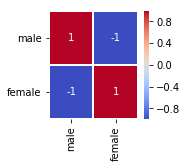

In [0]:
artr=['male','female']
housedatabool=trainasli[artr]
# heads[to_drop].corr()
# sns.heatmap(heads[to_drop].corr(),
#             annot=True, cmap = plt.cm.autumn_r, fmt='.3f');
fig, ax = plt.subplots(figsize=(2,2))
ax=sns.heatmap(housedatabool.corr(),
            vmin=-1, vmax=1,
            annot=True,
            cmap='coolwarm',
            linewidths=0.9,
            annot_kws={"size": 10})

plt.xticks(rotation=90)
plt.yticks(rotation=0) 
plt.show()

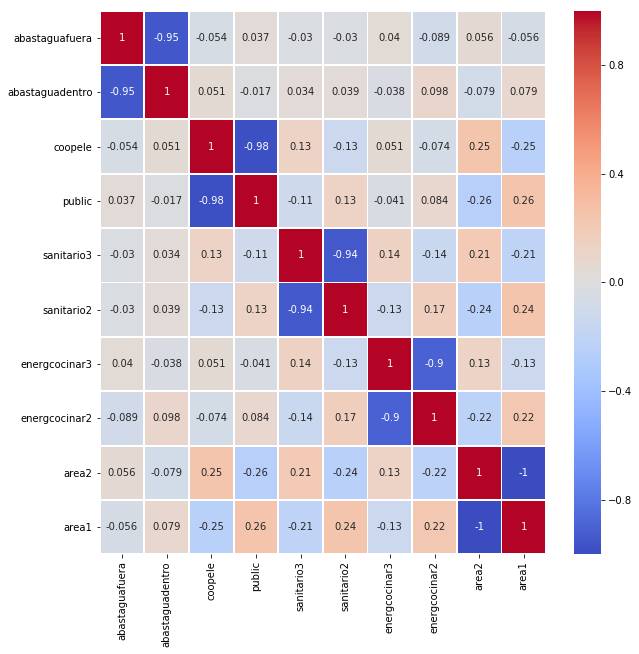

In [0]:
artr=['abastaguafuera','abastaguadentro','coopele','public','sanitario3','sanitario2','energcocinar3','energcocinar2','area2','area1']
housedatabool=trainasli[artr]
# heads[to_drop].corr()
# sns.heatmap(heads[to_drop].corr(),
#             annot=True, cmap = plt.cm.autumn_r, fmt='.3f');
fig, ax = plt.subplots(figsize=(10,10))
ax=sns.heatmap(housedatabool.corr(),
            vmin=-1, vmax=1,
            annot=True,
            cmap='coolwarm',
            linewidths=0.9,
            annot_kws={"size": 10})

plt.xticks(rotation=90)
plt.yticks(rotation=0) 
plt.show()

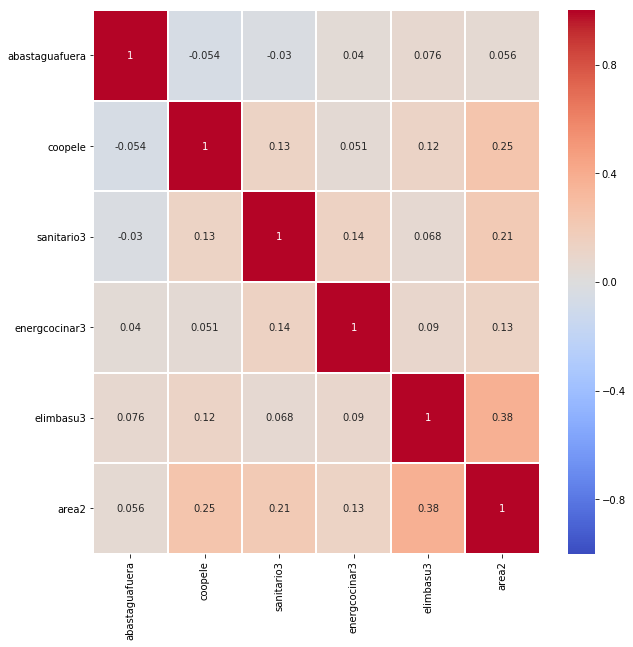

In [0]:
artr=['abastaguafuera','coopele','public','sanitario3',,'elimbasu3','area2',]
housedatabool=trainasli[artr]
# heads[to_drop].corr()
# sns.heatmap(heads[to_drop].corr(),
#             annot=True, cmap = plt.cm.autumn_r, fmt='.3f');
fig, ax = plt.subplots(figsize=(10,10))
ax=sns.heatmap(housedatabool.corr(),
            vmin=-1, vmax=1,
            annot=True,
            cmap='coolwarm',
            linewidths=0.9,
            annot_kws={"size": 10})

plt.xticks(rotation=90)
plt.yticks(rotation=0) 
plt.show()

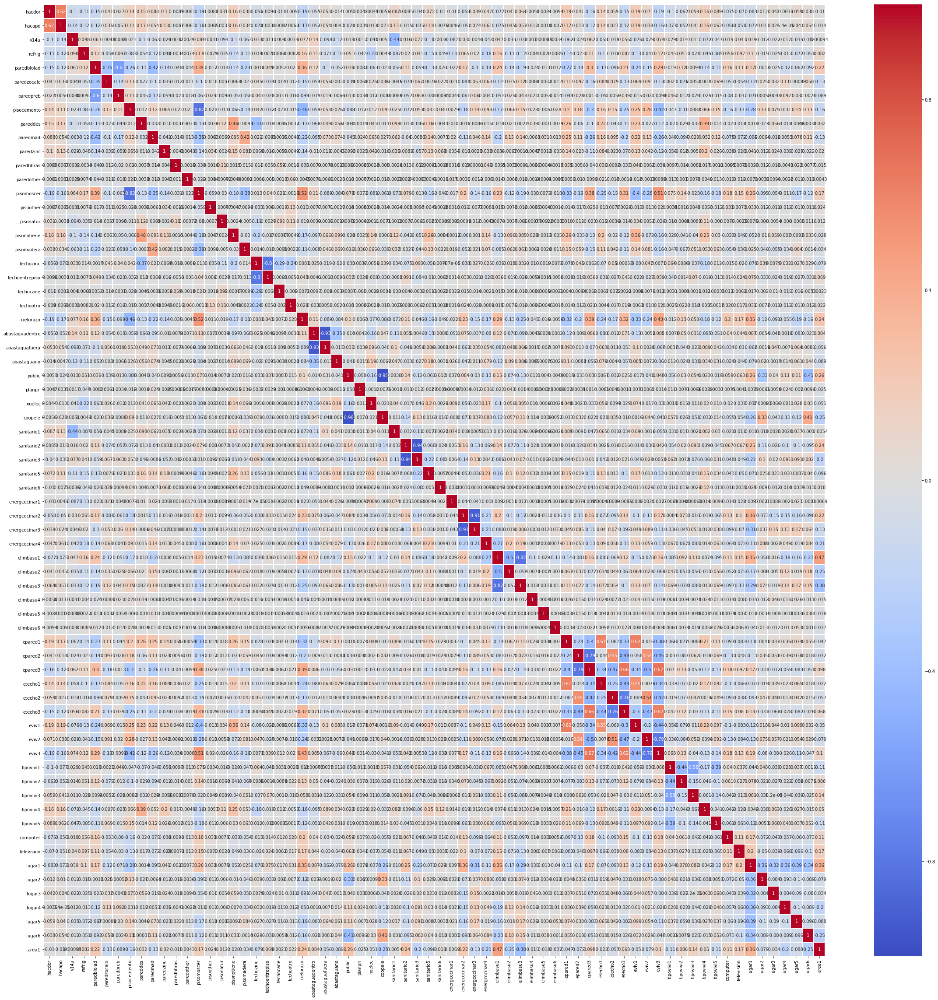

In [0]:
housedatabool=data[hh_bool]
# heads[to_drop].corr()
# sns.heatmap(heads[to_drop].corr(),
#             annot=True, cmap = plt.cm.autumn_r, fmt='.3f');
fig, ax = plt.subplots(figsize=(40,40))
ax=sns.heatmap(housedatabool.corr(),
            vmin=-1, vmax=1,
            annot=True,
            cmap='coolwarm',
            linewidths=0.9,
            annot_kws={"size": 10})

plt.xticks(rotation=90)
plt.yticks(rotation=0) 
plt.show()


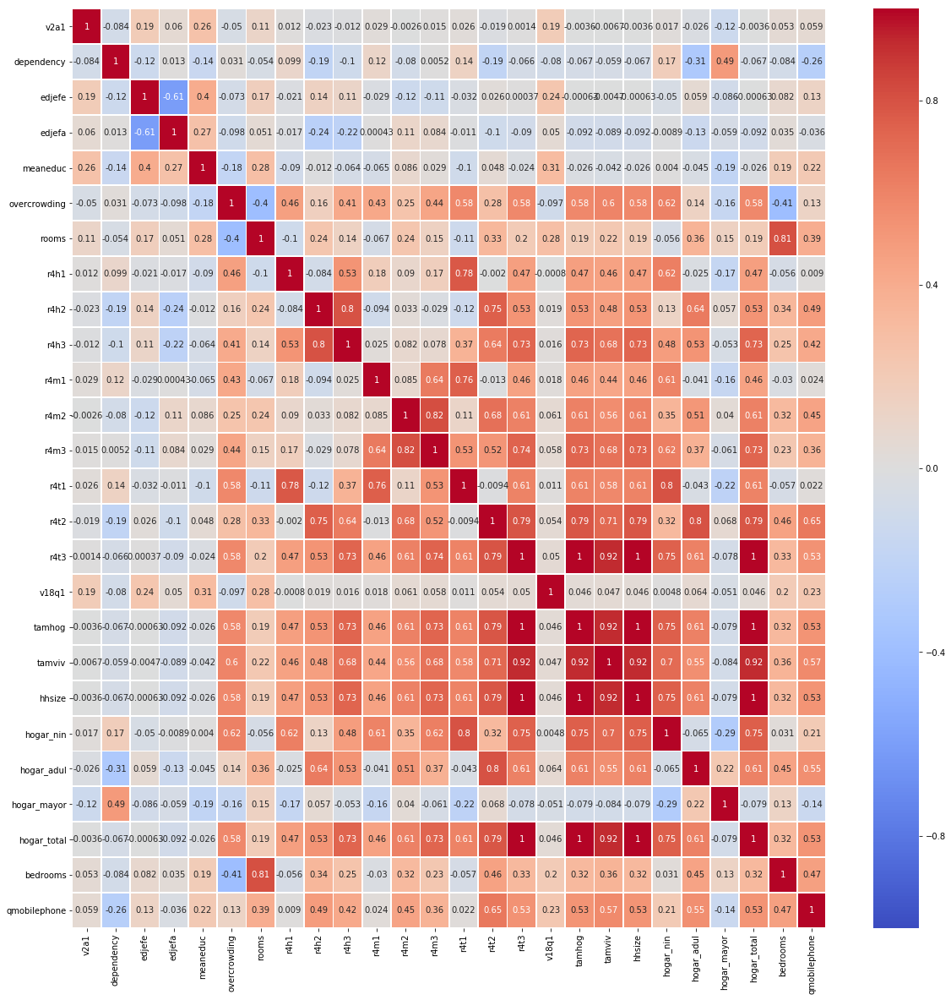

In [0]:
housedata=data[hh_cont + hh_ordered]
# heads[to_drop].corr()
# sns.heatmap(heads[to_drop].corr(),
#             annot=True, cmap = plt.cm.autumn_r, fmt='.3f');


fig, ax = plt.subplots(figsize=(20,20))
ax=sns.heatmap(housedata.corr(),
            vmin=-1, vmax=1,
            annot=True,
            cmap='coolwarm',
            linewidths=0.9,
            annot_kws={"size": 10})

plt.xticks(rotation=90)
plt.yticks(rotation=0) 
plt.show()


In [0]:

correl=train[hh_cont + hh_ordered].corr()
upper = correl.where(np.triu(np.ones(correl.shape), k=1).astype(np.bool))
to_drop = [column for column in upper.columns if any(abs(upper[column]) > 0.90)]
to_drop

['tamhog', 'tamviv', 'hhsize', 'hogar_total']

In [0]:
correl2=train[hh_bool].corr()
upper2 = correl2.where(np.triu(np.ones(correl2.shape), k=1).astype(np.bool))
to_drop2 = [column for column in upper2.columns if any(abs(upper2[column]) > 0.90)]
to_drop2

['abastaguafuera', 'coopele', 'sanitario3', 'energcocinar3', 'area2']

In [0]:
# hhsize has a perfect correlation with tamhog and hogar_total. 
# We will remove these two variables because the information is redundant.
# We can also remove r4t3 because it has a near perfect correlation with hhsize.
# tamviv is not necessarily the same as hhsize because there might be family members that are not living in the household. 
# Let's visualize this difference in a scatterplot.

# data = data.drop(columns = ['tamviv', 'hogar_total','hhsize'])
# for data in [train, test]:
#   data = data.drop(columns = ['tamhog','tamviv','hhsize','hogar_total'])
  
train = train.drop(columns = ['tamhog','tamviv','hhsize','hogar_total'])
test = test.drop(columns = ['tamhog','tamviv','hhsize','hogar_total'])


# sns.lmplot('tamviv', 'hhsize', data, fit_reg=False, size = 8);
# plt.title('Household size vs number of persons living in the household');

In [0]:
# for data in [train, test]:
#   data = data.drop(columns = ['abastaguafuera', 'coopele', 'sanitario3', 'energcocinar3'])
train = train.drop(columns = ['abastaguafuera', 'coopele', 'sanitario3', 'energcocinar3','area2'])
test = test.drop(columns = ['abastaguafuera', 'coopele', 'sanitario3', 'energcocinar3','area2'])

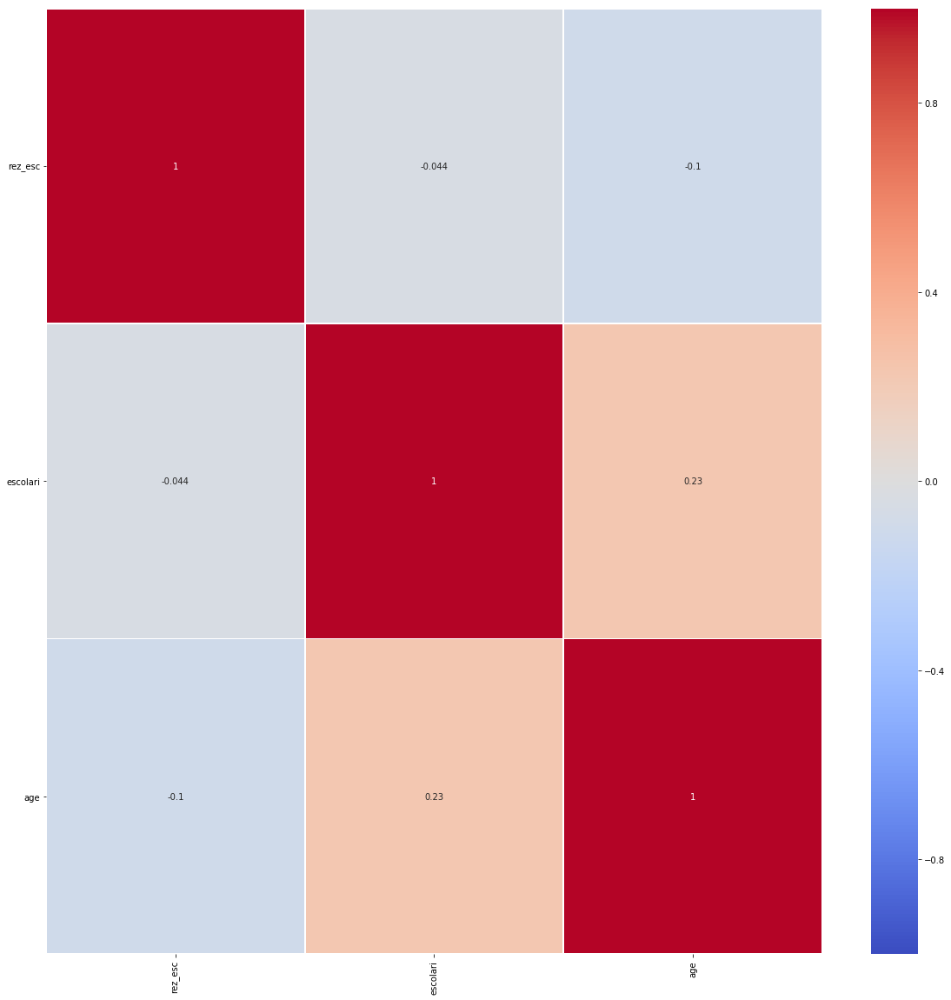

In [0]:
# data individual
indidata=data[ind_ordered]
fig, ax = plt.subplots(figsize=(20,20))
ax=sns.heatmap(indidata.corr(),
            vmin=-1, vmax=1,
            annot=True,
            cmap='coolwarm',
            linewidths=0.9,
            annot_kws={"size": 10})

plt.xticks(rotation=90)
plt.yticks(rotation=0) 
plt.show()

In [0]:
# Create correlation matrix
ind=data[ind_bool+ind_ordered]
corr_matrix = ind.corr()

# Select upper triangle of correlation matrix
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(np.bool))

# Find index of feature columns with correlation greater than 0.95
to_drop = [column for column in upper.columns if any(abs(upper[column]) > 0.9)]

to_drop

[]

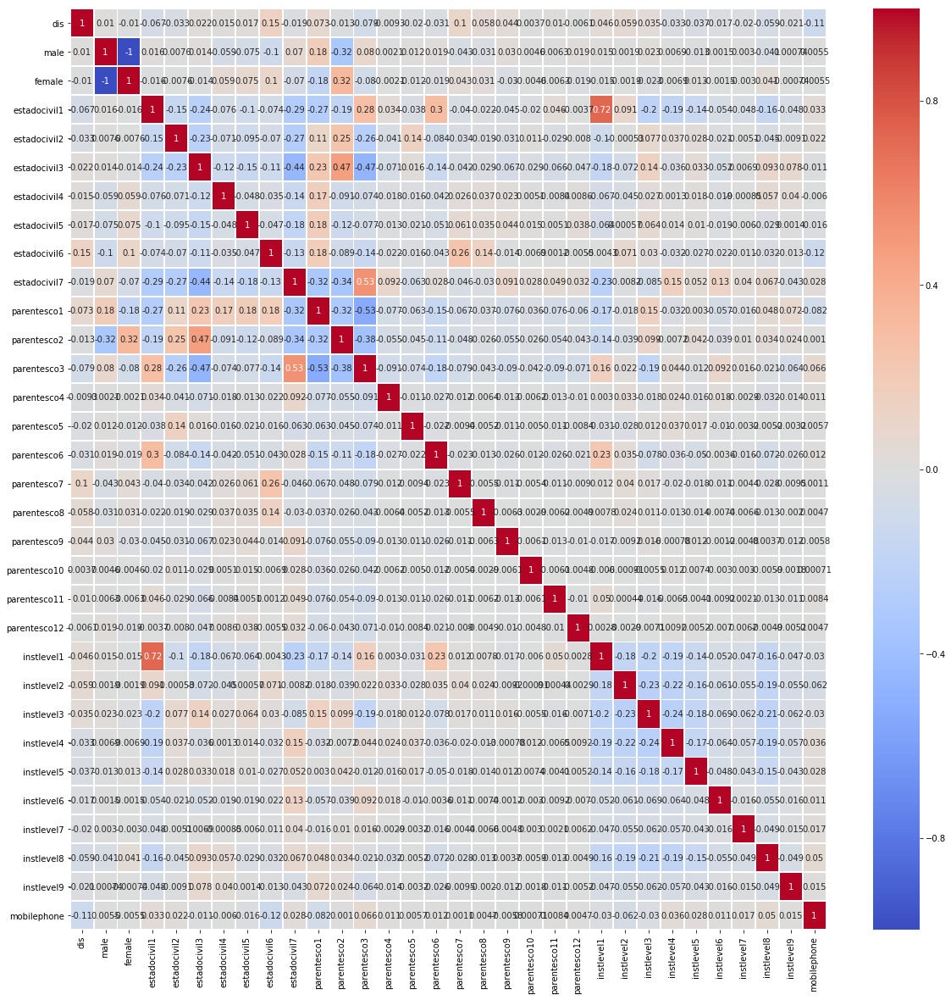

In [0]:
indidatabool=data[ind_bool]
# heads[to_drop].corr()
# sns.heatmap(heads[to_drop].corr(),
#             annot=True, cmap = plt.cm.autumn_r, fmt='.3f');
fig, ax = plt.subplots(figsize=(20,20))
ax=sns.heatmap(indidatabool.corr(),
            vmin=-1, vmax=1,
            annot=True,
            cmap='coolwarm',
            linewidths=0.9,
            annot_kws={"size": 10})

plt.xticks(rotation=90)
plt.yticks(rotation=0) 
plt.show()
# atribut male berkorelasi negatif (-1) dengan female, hilangkan salah satu

In [0]:
# for data in [train, test]:
#   data = data.drop(columns = 'male')
train = train.drop(columns = 'male')
test = test.drop(columns = 'male')

In [0]:
# data.dtypes.head(50)
train2=copy.deepcopy(train)
train3=copy.deepcopy(train)
# ngeubah atribut biner menjadi tipe data bool, aslinya int

# for data in [train,test] :
#    data[ind_bool+hh_bool] = df[ind_bool+hh_bool].astype(bool)

train2[ind_bool1+hh_bool1] = train2[ind_bool1+hh_bool1].astype(bool)

# train2.dtypes.head(50)

**`Replace Outlier with Median`**

In [0]:
# check outliers
traincekoutlier=copy.deepcopy(train2[hh_cont+hh_ordered1+ind_ordered]) 
# datacekoutlier.head()
Q1 = traincekoutlier.quantile(0.25)
Q3 = traincekoutlier.quantile(0.75)
IQR = Q3 - Q1

In [0]:
outliers=hh_cont+hh_ordered1+ind_ordered

trainclean=train2[~((traincekoutlier < (Q1 - 1.5 * IQR)) |(traincekoutlier > (Q3 + 1.5 * IQR))).any(axis=1)]
# outliers = [x for x in data if x < (Q1 - 1.5 * IQR)  or x > (Q3 + 1.5 * IQR)]
jumlah_outlier=train2.shape[0]-trainclean.shape[0]
jumlah_outlier

6026

In [0]:
# # dataclean = data[~((datacekoutlier < (Q1 - 1.5 * IQR)) |(datacekoutlier > (Q3 + 1.5 * IQR))).any(axis=1)]
# trainclean=train2[~((traincekoutlier < (Q1 - 1.5 * IQR)) |(traincekoutlier > (Q3 + 1.5 * IQR))).any(axis=1)]
# # outliers = [x for x in data if x < (Q1 - 1.5 * IQR)  or x > (Q3 + 1.5 * IQR)]
# jumlah_outlier=train2.shape[0]-trainclean.shape[0]


for i in range(len(outliers)) :
  upper_outliers=Q3[i] + 1.5 * IQR[i]
  lower_outliers=Q1[i] - 1.5 * IQR[i]
  median=train[outliers[i]].median()
  train2.loc[train2[outliers[i]]>upper_outliers, outliers[i]] = np.nan
  train2.loc[train2[outliers[i]]<lower_outliers, outliers[i]] = np.nan
  train2.fillna(median,inplace=True)


In [0]:
X=train2.drop(columns = 'Target')
X_cont=train2[hh_cont+hh_ordered1+ind_ordered]
X_cat=train2[ind_bool1+hh_bool1]
# y=train2.Target
X2=train2[hh_cont+hh_ordered1+ind_ordered+ind_bool1+hh_bool1]
X3=train3[hh_cont+hh_ordered1+ind_ordered+ind_bool1+hh_bool1]
y=train2.Target


In [0]:
print(X_cont.shape,X_cat.shape)

(9529, 25) (9529, 95)


**`Using PCA for Dimension Reduction for Continuous Attributes`**

In [0]:
# If our data has significant outliers, it can negatively impact our standardization by affecting the feature’s mean and variance. 
# In this scenario, it is often helpful to instead rescale the feature using the median and quartile range. 
# In scikit-learn, we do this using the RobustScaler method

scaler = MinMaxScaler(feature_range=[0, 1])
data_rescaled = scaler.fit_transform(X_cont)

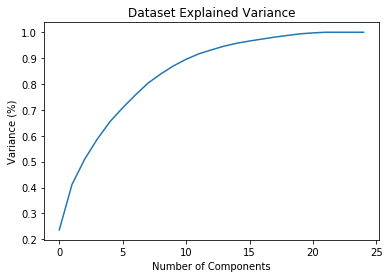

In [0]:
# PCA karena atributnya banyak anjir

pca = PCA().fit(data_rescaled)

#Plotting the Cumulative Summation of the Explained Variance
plt.figure()
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('Number of Components')
plt.ylabel('Variance (%)') #for each component
plt.title('Dataset Explained Variance')
plt.show()

In [0]:
# ngurangin dimensi data menjadi  atribut
pca = PCA(0.95)

train_pca = pca.fit_transform(data_rescaled)

In [0]:
pca.explained_variance_ratio_
total_inf_gain=0
for i in range(len(pca.explained_variance_ratio_)) :
  total_inf_gain=total_inf_gain+pca.explained_variance_ratio_[i]
  
  

# total_inf_gain=pca.explained_variance_ratio_[0]+pca.explained_variance_ratio_[1]
# print(total_inf_gain,pca.explained_variance_ratio_[0],pca.explained_variance_ratio_[1])
print(total_inf_gain,len(pca.explained_variance_ratio_))

0.9575536996093452 15


Using MCA(Multiple Correspondence Analysis) for Dimension Reduction for Continuous Attributes

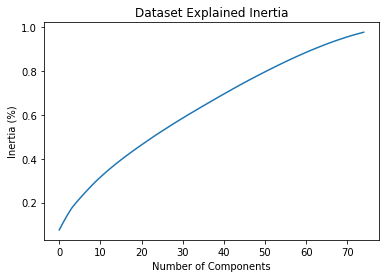

0.9765184235316753 75


In [0]:
# mca = prince.MCA(95).fit(X_cat)
mca = prince.MCA(75).fit(X_cat)
trainmca=mca.transform(X_cat)
# trainmca = mca.fit(X_cat)
# mca.eigenvalues_
# mca.total_inertia_
# mca.explained_inertia_ 


#Plotting the Cumulative Summation of the Explained Variance
plt.figure()
plt.plot(np.cumsum(mca.explained_inertia_ ))
plt.xlabel('Number of Components')
plt.ylabel('Inertia (%)') #for each component
plt.title('Dataset Explained Inertia')
plt.show()

#Plotting the Cumulative Summation of the Explained Variance
total_inf_gain=0
for i in range(len(mca.explained_inertia_)) :
  total_inf_gain=total_inf_gain+mca.explained_inertia_[i]

# total_inf_gain=pca.explained_variance_ratio_[0]+pca.explained_variance_ratio_[1]
# print(total_inf_gain,pca.explained_variance_ratio_[0],pca.explained_variance_ratio_[1])
print(total_inf_gain,len(mca.explained_inertia_))



# train_after_mca = pd.DataFrame(data = trainmca)
# # # gabungin ama target
# train_after_mca = pd.concat([train_after_mca, y], axis = 1)


In [0]:
train_after_mca = pd.DataFrame(data = trainmca)
train_after_pca = pd.DataFrame(data = train_pca)
train2 = pd.concat([train_after_mca,train_after_pca, y], axis = 1)
train2.head()

,0,1,2,3,4,5,6,7,8,9,...,6,7,8,9,10,11,12,13,14,Target
0,0.033386,0.445120,-0.173643,0.278043,0.010527,0.200284,0.397242,0.228849,-0.403955,-0.295388,...,-0.074353,-0.254469,-0.136822,-0.150135,0.056631,0.091476,-0.018374,-0.053851,0.000417,4.0
1,0.140383,0.041936,-0.336683,0.262360,0.099832,0.101733,-0.350794,0.093515,-0.221784,-0.166599,...,0.051238,-0.209995,-0.287219,0.132033,0.087975,0.042079,0.121686,-0.025466,0.000592,4.0
2,-0.076899,0.037906,-0.028822,0.267991,0.122918,0.234353,-0.171573,-0.268734,-0.327893,0.115350,...,0.188702,0.071817,-0.253100,0.323960,0.139662,0.076405,0.149657,-0.192775,0.166468,4.0
3,-0.276705,0.141643,-0.098295,-0.156409,0.117766,-0.107692,-0.060426,0.161464,-0.029726,-0.036606,...,0.199951,-0.240128,-0.038543,-0.061276,-0.074418,-0.065070,-0.068430,0.023116,-0.025107,4.0
4,-0.286667,0.078112,0.006101,0.129918,-0.156709,-0.096610,-0.090260,0.184291,0.102784,-0.127906,...,0.192018,-0.208385,-0.132319,0.095354,-0.024557,0.023823,-0.050093,0.002123,-0.035729,4.0


In [0]:
train2.shape

(9524, 91)

In [0]:
# oversampling
from collections import Counter
from sklearn.datasets import make_classification
from imblearn.over_sampling import SMOTE 
from imblearn.under_sampling import NearMiss
Xsmote = train2.drop(columns = 'Target')
ysmote = train2['Target']
X_smot,y_smot=SMOTE().fit_sample(Xsmote,ysmote)
X_smo,y_smo=NearMiss().fit_sample(Xsmote,ysmote)
print(Counter(y_smo))
print(Counter(y_smot))
X_smote = pd.DataFrame(data = X_smot)
X_smote['Target'] = pd.DataFrame(data = y_smot)
X_nm = pd.DataFrame(data = X_smo)
X_nm['Target'] = pd.DataFrame(data = y_smo)
print(X_smote.shape)
print(X_nm.shape)
# trainsmote=pd.concat([X_smote,y_smote], axis = 1)
# X_nm.head()

Counter({1.0: 774, 2.0: 774, 3.0: 774, 4.0: 774})
Counter({4.0: 5996, 2.0: 5996, 3.0: 5996, 1.0: 5996})
(23984, 91)
(3096, 91)


In [0]:
trainsmote.shape

(23984, 91)

In [0]:
# trainsmote['Target']=trainsmote.iloc[:,-1]
# df.drop(['B', 'C'], axis=1)
train2 = trainsmote.drop(columns = [trainsmote.columns[-1]])
# trainsmote.head()
print(train2.shape)
print(trainsmote.shape)
# trainsmote.iloc[:, n]
# trainsmote=trainsmote.drop(trainsmote[trainsmote.iloc[:,-2]],axis=1,inplace=True)

(23984, 89)
(23984, 91)


In [0]:
X_nm.head()

,0,1,2,3,4,5,6,7,8,9,...,81,82,83,84,85,86,87,88,89,Target
0,0.065312,0.141342,-0.194294,-0.210362,-0.261813,-0.010090,-0.081940,-0.099918,-0.027330,-0.098030,...,0.516136,0.023428,0.174472,-0.313230,0.634958,-0.273043,0.019784,-0.072286,-0.149698,1.0
1,0.078246,0.140714,-0.190187,-0.187873,-0.221221,0.019542,-0.080291,-0.162847,-0.107356,-0.051099,...,0.515607,0.020647,0.177785,-0.319691,0.633401,-0.276673,0.016436,-0.069456,-0.149159,1.0
2,0.065312,0.141342,-0.194294,-0.210362,-0.261813,-0.010090,-0.081940,-0.099918,-0.027330,-0.098030,...,0.517724,0.031771,0.164532,-0.293845,0.639629,-0.262154,0.029825,-0.080775,-0.151316,1.0
3,0.009002,0.056422,-0.077535,0.195313,-0.058224,-0.143621,-0.050503,0.026989,-0.067216,-0.013800,...,0.454759,-0.005330,-0.015095,-0.048555,0.747212,-0.120748,-0.094309,0.002201,-0.161984,1.0
4,-0.009780,0.040158,-0.060553,0.217203,-0.144336,-0.139166,-0.037826,0.020632,0.123032,-0.149790,...,0.428037,-0.035581,-0.062990,0.005467,0.778408,-0.089047,-0.160524,0.049940,-0.162815,1.0


# **`Machine Learning Modeling`**

In [0]:
# pd.isnull(X_nm.Target).sum() >0

# print(train.shape)
# print(train2.shape)
train2=train2.dropna()
# X_smote=X_smote.dropna()
# print(train2.shape)

# train=train.apply(lambda x: x.fillna(x.mean()),axis=0)

# missing= pd.DataFrame(train2.isnull().sum()).rename(columns = {0: 'total'})

# # # Create a percentage missing

# missing['percent'] = missing['total'] / len(train)

# missing.sort_values('percent', ascending = False).head(10)
# train.fillna(train.mean(), inplace=True)

In [0]:
y_smote

array(['4', '4', '4', ..., '3', '3', '3'], dtype=object)

In [0]:
# lab_enc = preprocessing.LabelEncoder()
# training_scores_encoded = lab_enc.fit_transform(train2.Target)
# train2.Target=training_scores_encoded
# train2.Target.head(20)
# 
# train2.Target.replace([0.0, 1.0, 2.0, 3.0], [1, 2, 3, 4])
# train2.Target=train2.Target.replace([0.0, 1.0, 2.0, 3.0], ['1','2','3','4'])
train2.Target=train2.Target.replace([1.0, 2.0, 3.0, 4.0], ['1','2','3','4'])
# y.head()
# X.head()

In [0]:
print(train2.shape)
print(train3.shape)

(9524, 91)
(9529, 123)


In [0]:
X2 = trainsmote.drop(columns = trainsmote.columns[-1])
# X3 = train3.drop(columns = 'Target')
y2 = trainsmote[trainsmote.columns[-1]]
print(X2.shape)
print(y2.shape)
y2.head()

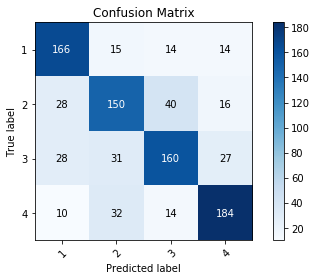

In [0]:
import numpy as np
import matplotlib.pyplot as plt

cm=[[166,15,14,14],
    [28,150,40,16],
    [28,31,160,27],
    [10,32,14,184]]
cm=np.array(cm,dtype=np.int32)
fig, ax = plt.subplots()
im = ax.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
ax.figure.colorbar(im, ax=ax)
    # We want to show all ticks...
ax.set(xticks=np.arange(cm.shape[1]),yticks=np.arange(cm.shape[0]),
           xticklabels=[1,2,3,4], yticklabels=[1,2,3,4],
           title='Confusion Matrix',
           ylabel='True label',
           xlabel='Predicted label')

    # Rotate the tick labels and set their alignment.
plt.setp(ax.get_xticklabels(), rotation=45, ha="right",
             rotation_mode="anchor")

    # Loop over data dimensions and create text annotations.
fmt = 'd'
thresh = cm.max() / 2.
for i in range(cm.shape[0]):
  for j in range(cm.shape[1]):
     ax.text(j, i, format(cm[i, j], fmt),ha="center", va="center", color="white" if cm[i, j] > thresh else "black")
fig.tight_layout()


In [0]:
def get_score(model,X_train,X_test, y_train, y_test) :
  model.fit(X_train,y_train)
  return model.score(X_test,y_test)

In [0]:
# # X -> features, y -> label 
# X2 = trainsmote.drop(columns = trainsmote.columns[-1])
X_smote1 = X_smote.drop(columns = 'Target')
X_nm1 = X_nm.drop(columns = 'Target')
X21 = X2.drop(columns = 'Target')
y_smote = X_smote['Target']
y_nm = X_nm['Target']
y2=X2['Target']
scoresun=[]
scoresov=[]
scoresig=[]

# from sklearn.model_selection import StratifiedKFold
# folds = StratifiedKFold(n_splits=10)

# for train_idx,test_idx in folds.split(X_smote1):
#   X_train, X_test, y_train, y_test = X_smote1[train_idx],X_smote1[test_idx],y_smote[train_idx],y_smote[test_idx]
#   scoresun.append(get_score(SVC(gamma=1,C=10,kernel='rbf'), X_train,X_test, y_train, y_test ))
# for train_idx,test_idx in folds.split(X_nm1):
#   X_train, X_test, y_train, y_test = X_nm1[train_idx],X_nm1[test_idx],y_nm[train_idx],y_nm[test_idx]
#   scoresun.append(get_score(SVC(gamma=1,C=10,kernel='rbf'), X_train,X_test, y_train, y_test ))
# for train_idx,test_idx in folds.split(X21):
#   X_train, X_test, y_train, y_test = X21[train_idx],X21[test_idx],y2[train_idx],y2[test_idx]
#   scoresun.append(get_score(SVC(gamma=1,C=10,kernel='rbf'), X_train,X_test, y_train, y_test ))

from sklearn.model_selection import cross_val_score
scoresov.append(cross_val_score(SVC(gamma=1,C=10,kernel='rbf'),X_smote1,y_smote,cv=10))
scoresun.append(cross_val_score(SVC(gamma=1,C=10,kernel='rbf'),X_nm1,y_nm,cv=10))
scoresig.append(cross_val_score(SVC(gamma=1,C=10,kernel='rbf'),X21,y2,cv=10))
  
print(scoresun)
print(scoresov)
print(scoresig)
# Cs = [0.001, 0.01, 0.1, 1, 10]
# gammas = [0.001, 0.01, 0.1, 1]
# kernels = ['linear','rbf']
# param_grid = {'C': Cs, 'gamma' : gammas, 'kernel' : kernels}

# svm_model = SVC(gamma=1,C=10,kernel='rbf')

# svm_model = GridSearchCV(SVC(), param_grid, cv=5)
# svm_model.fit(X_train, y_train)

# print(svm_model.best_params_)

# predictionun=svm_model.predict(X_test)
# accuracy = svm_model.score(X_test, y_test) 
# print(accuracy)
# cm = confusion_matrix(y_test,predictionun)
# print(cm)

[array([0.42, 0.57, 0.57, 0.68, 0.67, 0.7 , 0.63, 0.73, 0.61, 0.64])]
[array([0.96, 0.96, 0.97, 0.94, 0.96, 0.96, 0.92, 0.87, 0.85, 0.85])]
[array([0.6 , 0.58, 0.59, 0.55, 0.56, 0.55, 0.49, 0.33, 0.4 , 0.52])]


In [0]:
scoresig[1]

IndexError: ignored

In [0]:
scoresig=list(scoresig)
scoresun=list(scoresun)
scoresov=list(scoresov)
# total1=0
# total2=0
# total3=0
# for i in range(11):
#   total1+=scoresun[i]
#   total2+=scoresov[i]
#   total3+=scoresig[i]
# total1/=10
# total2/=10
# total3/=10
# print("undersampling :"+total1)
# print("oversampling :"+total1)
# print("imbalanced ignored :"+total1)
  

AttributeError: ignored

In [0]:

X=train2.drop(columns = 'Target')
y=train2['Target']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30) 

# C         gamma       kernel      acc
# 0.001     0.001       rbf         0.61
# 0.001     0.01        rbf         0.62
# 0.001     0.1         rbf         0.62
# 0.001     1           rbf         0.62
# 0.001     10          rbf         0.62
# 0.01      0.001       rbf         0.62
# 0.01      0.01        rbf         0.63
# 0.01      0.1         rbf         0.63
# 0.01      1           rbf         0.63
# 0.01      10          rbf         0.64
# 0.1       0.001       rbf         0.62
# 0.1       0.01        rbf         0.63
# 0.1       0.1         rbf         0.63
# 0.1       1           rbf         0.64
# 0.1       10          rbf         0.69
# 1         0.001       rbf         0.62
# 1         0.01        rbf         0.63
# 1         0.1         rbf         0.63
# 1         1           rbf         0.75
# 1         10          rbf         0.80
# 10        0.001       rbf         0.62
# 10        0.01        rbf         0.62
# 10        0.1         rbf         0.62
# 10        1           rbf         0.63
# 10        10          rbf         0.64

# Cs = [0.001, 0.01, 0.1, 1, 10]
# gammas = [0.001, 0.01, 0.1, 1]
# kernels = ['linear','rbf']
# param_grid = {'C': Cs, 'gamma' : gammas, 'kernel' : kernels}

# svm_model = SVC(gamma=1,C=10,kernel='rbf')

svm_model = SVC(gamma=10,C=10,kernel='rbf')

modelover=svm_model.fit(X_train, y_train)


predictionover=svm_model.predict(X_test)
accuracy = svm_model.score(X_test, y_test) 
print(accuracy)
# cm = confusion_matrix(y_test,predictionov)
# print(cm)


0.6434569629111266


In [0]:
# SVM

# # X -> features, y -> label 
# # X2 = trainsmote.drop(columns = trainsmote.columns[-1])
# X2 = X_smote.drop(columns = 'Target')
# # y2 = trainsmote[trainsmote.columns[-1]]
# y2 = X_smote['Target']

# # Tuning Parameter
# # params_grid = [{'kernel': ['rbf'], 'gamma': [1e-2, 1e-3, 1e-4, 1e-5],
# #                      'C': [0.001, 0.10, 0.1, 10]},
# #                     {'kernel': ['sigmoid'], 'gamma': [1e-2, 1e-3, 1e-4, 1e-5],
# #                      'C': [0.001, 0.10, 0.1, 10]},
# #                     {'kernel': ['linear'], 'C': [0.001, 0.10, 0.1, 10]}]


# # data yang udah direduksi dimensinya
# # dividing X, y into train and test data 
# X_train, X_test, y_train, y_test = train_test_split(X2, y2, test_size=0.30) 

# # Cs = [0.001, 0.01, 0.1, 1, 10]
# # gammas = [0.001, 0.01, 0.1, 1]
# # kernels = ['linear','rbf']
# # param_grid = {'C': Cs, 'gamma' : gammas, 'kernel' : kernels}

# svm_model = SVC(gamma=1,C=10,kernel='rbf')
# # svm_model = SVC()

# # svm_model = GridSearchCV(SVC(), param_grid, cv=5)
# svm_model.fit(X_train, y_train)

# # print(svm_model.best_params_)

# predictionov=svm_model.predict(X_test)
# accuracy = svm_model.score(X_test, y_test) 
# print(accuracy)
# cm = confusion_matrix(y_test,predictionov)
# print(cm)

def plot_confusion_matrix(y_true, y_pred, classes,
                          normalize=False,
                          title=None,
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if not title:
        if normalize:
            title = 'Normalized confusion matrix'
        else:
            title = 'Confusion matrix, without normalization'

    # Compute confusion matrix
    cm = confusion_matrix(y_true, y_pred)
    # Only use the labels that appear in the data
    classes = classes['1','2','3','4']
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    print(cm)

    fig, ax = plt.subplots()
    im = ax.imshow(cm, interpolation='nearest', cmap=cmap)
    ax.figure.colorbar(im, ax=ax)
    # We want to show all ticks...
    ax.set(xticks=np.arange(cm.shape[1]),
           yticks=np.arange(cm.shape[0]),
           # ... and label them with the respective list entries
           xticklabels=classes, yticklabels=classes,
           title=title,
           ylabel='True label',
           xlabel='Predicted label')

    # Rotate the tick labels and set their alignment.
    plt.setp(ax.get_xticklabels(), rotation=45, ha="right",
             rotation_mode="anchor")

    # Loop over data dimensions and create text annotations.
    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            ax.text(j, i, format(cm[i, j], fmt),
                    ha="center", va="center",
                    color="white" if cm[i, j] > thresh else "black")
    fig.tight_layout()
    return ax


np.set_printoptions(precision=2)

# Plot non-normalized confusion matrix
plot_confusion_matrix(y_test, predictionun, classes=[1,2,3,4],title='Confusion matrix')


TypeError: ignored

In [0]:
print(svm_model.best_params_)

{'C': 10, 'gamma': 1, 'kernel': 'rbf'}


In [0]:
accuracy=[]
total=[0,0,0,0]
# accuracy for each class
for i in range(4):
  for j in range(4):
    if i==j :
      accuracy.append(cm[i][j])
      total[i]+=cm[i][j]
    else :
      total[i]+=cm[i][j]
print(accuracy)
print(total)
for i in range(4):
  print(round((accuracy[i]/total[i])*100,2))

[1793, 1820, 1764, 1622]
[1796, 1858, 1773, 1769]
99.83
97.95
99.49
91.69


In [0]:
# SVM

# # X -> features, y -> label 
X2 = train2.drop(columns = 'Target')
# y2 = trainsmote[trainsmote.columns[-1]]
y2 = train2['Target']


# Tuning Parameter
# params_grid = [{'kernel': ['rbf'], 'gamma': [1e-2, 1e-3, 1e-4, 1e-5],
#                      'C': [0.001, 0.10, 0.1, 10]},
#                     {'kernel': ['sigmoid'], 'gamma': [1e-2, 1e-3, 1e-4, 1e-5],
#                      'C': [0.001, 0.10, 0.1, 10]},
#                     {'kernel': ['linear'], 'C': [0.001, 0.10, 0.1, 10]}]


# data yang udah direduksi dimensinya
# dividing X, y into train and test data 
X_train, X_test, y_train, y_test = train_test_split(X2, y2, test_size=0.30) 

# Cs = [0.001, 0.01, 0.1, 1, 10]
# gammas = [0.001, 0.01, 0.1, 1]
# kernels = ['linear','rbf']
# param_grid = {'C': Cs, 'gamma' : gammas, 'kernel' : kernels}

svm_model = SVC(gamma=1,C=10,kernel='rbf')

# svm_model = GridSearchCV(SVC(), param_grid, cv=5)
svm_model.fit(X_train, y_train)

# print(svm_model.best_params_)

predictionign=svm_model.predict(X_test)
accuracyign = svm_model.score(X_test, y_test) 
print(accuracyign)
cmign = confusion_matrix(y_test,prediction)
print(cmign)

0.7907627711686495
[[   0    0    0  240]
 [   0    0    0  464]
 [   0    3    0  333]
 [   0   11    0 1807]]


In [0]:
prediction

array(['2', '4', '4', ..., '4', '1', '4'], dtype=object)

In [0]:
import warnings
from matplotlib.colors import ListedColormap

def versiontuple(v):
    return tuple(map(int, (v.split("."))))


def plot_decision_regions(X, y, classifier, test_idx=None, resolution=0.02):

    # setup marker generator and color map
    markers = ('s', 'x', 'o', '^', 'v')
    colors = ('red', 'blue', 'lightgreen', 'gray', 'cyan')
    cmap = ListedColormap(colors[:len(np.unique(y))])

    # plot the decision surface
    x1_min, x1_max = X[:, 0].min() - 1, X[:, 0].max() + 1
    x2_min, x2_max = X[:, 1].min() - 1, X[:, 1].max() + 1
    xx1, xx2 = np.meshgrid(np.arange(x1_min, x1_max, resolution),
                           np.arange(x2_min, x2_max, resolution))
    Z = classifier.predict(np.array([xx1.ravel(), xx2.ravel()]).T)
    Z = Z.reshape(xx1.shape)
    plt.contourf(xx1, xx2, Z, alpha=0.4, cmap=cmap)
    plt.xlim(xx1.min(), xx1.max())
    plt.ylim(xx2.min(), xx2.max())

    for idx, cl in enumerate(np.unique(y)):
        plt.scatter(x=X[y == cl, 0], y=X[y == cl, 1],
                    alpha=0.8, c=cmap(idx),
                    marker=markers[idx], label=cl)
        
        
        
plot_decision_regions(X_test, y_test, svm_model)

TypeError: ignored

In [0]:
from sklearn.decomposition import PCA
pca = PCA(n_components=2).fit(X_test)
pca_2d = pca.transform(X_test)

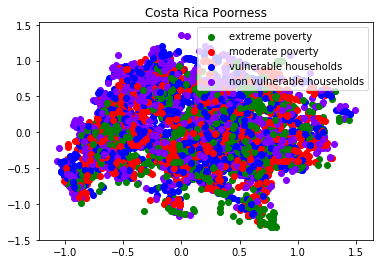

In [0]:
import pylab as pl
import matplotlib.cm as cm

for i in range(0, pca_2d.shape[0]):
  if predictionover[i] == 1.0:
    c1 = pl.scatter(pca_2d[i,0],pca_2d[i,1],c='green',    marker='o')
  elif predictionover[i] == 2.0:
    c2 = pl.scatter(pca_2d[i,0],pca_2d[i,1],c='red',    marker='o')
  elif predictionover[i] == 3.0:
    c3 = pl.scatter(pca_2d[i,0],pca_2d[i,1],c='blue',    marker='o')
  else :
    c4 = pl.scatter(pca_2d[i,0],pca_2d[i,1],c=cm.rainbow(np.linspace(0, 1, 1)),    marker='o')

# pl.contourf(c1, c2,c3,c4, svm_model.predict(np.array([c1.ravel(),c2.ravel(),c3.ravel(),c4.ravel()]).T).reshape(c1.shape),
#              alpha = 0.75, cmap = ListedColormap(('red', 'green','blue',(np.linspace(0, 1, 1)))))
pl.legend([c1, c2, c3, c4], ['extreme poverty', 'moderate poverty', 'vulnerable households' , 'non vulnerable households'])
pl.title('Costa Rica Poorness')
pl.show()

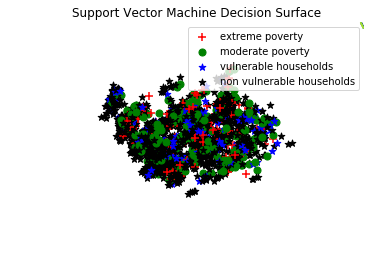

In [0]:
from sklearn.decomposition import PCA
from sklearn.datasets import load_iris
from sklearn import svm
# from sklearn import cross_validation
import pylab as pl
import numpy as np
iris = load_iris()
# X_train, X_test, y_train, y_test =   cross_validation.train_test_split(iris.data,   iris.target, test_size=0.10, random_state=111)
pca = PCA(n_components=2).fit(X_test)
pca_2d = pca.transform(X_test)
svmClassifier_2d =   svm.LinearSVC(random_state=111).fit(pca_2d, prediction)
for i in range(0, pca_2d.shape[0]):
  if prediction[i] == '1':
    c1 = pl.scatter(pca_2d[i,0],pca_2d[i,1],c='r',    s=50,marker='+')
  elif prediction[i] == '2':
    c2 = pl.scatter(pca_2d[i,0],pca_2d[i,1],c='g',    s=50,marker='o')
  elif prediction[i] == '3':
    c3 = pl.scatter(pca_2d[i,0],pca_2d[i,1],c='b',    s=50,marker='*')
  else :
    c4 = pl.scatter(pca_2d[i,0],pca_2d[i,1],c='black',    s=50,marker='*')
pl.legend([c1, c2, c3, c4], ['extreme poverty', 'moderate poverty', 'vulnerable households' , 'non vulnerable households'])
x_min, x_max = pca_2d[:, 0].min() - 1,   pca_2d[:,0].max() + 1
y_min, y_max = pca_2d[:, 1].min() - 1,   pca_2d[:, 1].max() + 1
xx, yy = np.meshgrid(np.arange(x_min, x_max, .01),   np.arange(y_min, y_max, .01))
Z = svmClassifier_2d.predict(np.c_[xx.ravel(),  yy.ravel()])
Z = Z.reshape(xx.shape)
pl.contour(xx, yy, Z)
pl.title('Support Vector Machine Decision Surface')
pl.axis('off')
pl.show()

In [0]:
from sklearn.decomposition import PCA
pca = PCA(n_components=2).fit(X_smote1)
pca_2d = pca.transform(X_smote1)

def make_meshgrid(x, y, h=.02):
    """Create a mesh of points to plot in

    Parameters
    ----------
    x: data to base x-axis meshgrid on
    y: data to base y-axis meshgrid on
    h: stepsize for meshgrid, optional

    Returns
    -------
    xx, yy : ndarray
    """
    x_min, x_max = x.min() - 1, x.max() + 1
    y_min, y_max = y.min() - 1, y.max() + 1
    xx, yy = np.meshgrid(np.arange(x_min, x_max, h),
                         np.arange(y_min, y_max, h))
    return xx, yy


def plot_contours(ax, clf, xx, yy, **params):
    """Plot the decision boundaries for a classifier.

    Parameters
    ----------
    ax: matplotlib axes object
    clf: a classifier
    xx: meshgrid ndarray
    yy: meshgrid ndarray
    params: dictionary of params to pass to contourf, optional
    """
    Z = clf.predict(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)
    out = ax.contourf(xx, yy, Z, **params)
    return out

  
fig, sub = plt.subplots(1,0)
plt.subplots_adjust(wspace=0.4, hspace=0.4)
  
X0, X1 = pca_2d[:,0], pca_2d[:, 1]
xx, yy = make_meshgrid(X0, X1)
ax=sub.flatten()

clf=modelover

plot_contours(ax, clf, xx, yy,
                  cmap=plt.cm.coolwarm, alpha=0.8)
ax.scatter(X0, X1, c=y, cmap=plt.cm.coolwarm, s=20, edgecolors='k')
ax.set_xlim(xx.min(), xx.max())
ax.set_ylim(yy.min(), yy.max())
ax.set_xlabel('Sepal length')
ax.set_ylabel('Sepal width')
ax.set_xticks(())
ax.set_yticks(())
ax.set_title(title)

plt.show()
  

ValueError: ignored

<Figure size 432x288 with 0 Axes>

In [0]:
# dividing X, y into train and test data 
# 

train3=copy.deepcopy(train)
train3[ind_bool1+hh_bool1] = train3[ind_bool1+hh_bool1].astype(bool)
X3=train3.drop(columns = id_)
y3=train3.Target
# X3.head()
X_train, X_test, y_train, y_test = train_test_split(X3, y3, test_size=0.25) 

Cs = [0.001, 0.01, 0.1, 1, 10]
gammas = [0.001, 0.01, 0.1, 1]
kernels = ['linear','rbf']
param_grid = {'C': Cs, 'gamma' : gammas, 'kernel' : kernels}

svm_model = GridSearchCV(SVC(), param_grid, cv=5)
svm_model.fit(X_train, y_train)

print(svm_model.best_params_)

prediction=svm_model.predict(X_test)
accuracy = svm_model.score(X_test, y_test) 
print(accuracy)
cm = confusion_matrix(y_test,prediction)
print(cm)

In [0]:
# RANDOM FOREST
# from sklearn.ensemble import RandomForestClassifier
# from sklearn.datasets import make_classification
# from sklearn.model_selection import train_test_split

# #Create a Gaussian Classifier
# clf=RandomForestClassifier(n_estimators=100)

# #Train the model using the training sets 
# clf.fit(X_train,y_train)

# y_pred=clf.predict(X_test)

# #Import scikit-learn metrics module for accuracy calculation
# from sklearn import metrics
# # Model Accuracy, how often is the classifier correct?
# print("Accuracy:",metrics.accuracy_score(y_test, y_pred))

In [0]:
# b=ind_bool+ind_ordered+hh_bool+hh_ordered+hh_cont
# print(len(b))

120


In [0]:
# from sklearn.tree import DecisionTreeClassifier

# # Create Decision Tree classifer object
# clf = DecisionTreeClassifier(criterion="entropy",max_depth=17)

# # Train Decision Tree Classifer
# clf = clf.fit(X_train,y_train)

# #Predict the response for test dataset
# y_pred = clf.predict(X_test)

# print("Accuracy:",metrics.accuracy_score(y_test, y_pred))


# # Visualizing the tree
# from sklearn.tree import export_graphviz
# from sklearn.externals.six import StringIO  
# from IPython.display import Image  
# import pydotplus

# dot_data = StringIO()
# export_graphviz(clf, out_file=dot_data,  
#                 filled=True, rounded=True,
#                 special_characters=True,feature_names =ind_bool+ind_ordered+hh_bool+hh_ordered+hh_cont ,class_names=['1','2','3','4'])
# graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
# graph.write_png('poor.png')
# Image(graph.create_png())

Accuracy: 0.921947125472094
dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.665347 to fit

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.665347 to fit



In [0]:
#LOGISTIC REGRESSION
# from sklearn.linear_model import LogisticRegression
# from sklearn import metrics

# # X = train2.drop(columns = 'Target')
# # y = train2['Target']

# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25) 

# # clf = LogisticRegression(random_state=0, solver='lbfgs', multi_class='multinomial').fit(X_train, y_train)
# #  ‘newton-cg’, ‘sag’, ‘saga’ and ‘lbfgs’
# clf = LogisticRegression(multi_class='multinomial',solver='newton-cg').fit(X_train, y_train)
# #Predict the response for test dataset
# y_pred = clf.predict(X_test)

# # Model Accuracy, how often is the classifier correct?
# print("Accuracy:",metrics.accuracy_score(y_test, y_pred)*100)

/usr/local/lib/python3.6/dist-packages/scipy/optimize/linesearch.py:462: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
/usr/local/lib/python3.6/dist-packages/scipy/optimize/linesearch.py:313: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)


Accuracy: 67.93957196810743


/usr/local/lib/python3.6/dist-packages/sklearn/utils/optimize.py:203: ConvergenceWarning: newton-cg failed to converge. Increase the number of iterations.
  "number of iterations.", ConvergenceWarning)
